# Visual lab: aug, YOLO args, SAHI, matrices, CLAHE, trackers

Same dummy (`guides/owl.jpg`, resized). Boxes from YOLO-World: owl + two eyes. Repo values live in `src/common/aug_config.py`.

1. Dummy scene
2. Ultralytics augmentations
3. YOLO `train()` / `predict()` args
4. SAHI tiling
5. Homogeneous matrices vs OpenCV warps
6. CLAHE
7. ByteTrack / BoT-SORT


In [1]:
from __future__ import annotations

import math
import sys
import time
from pathlib import Path
from types import SimpleNamespace

import cv2
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore", message=".*FigureCanvasAgg is non-interactive.*")
import numpy as np
import yaml

ROOT = Path.cwd().resolve()
if not (ROOT / "src").is_dir():
    ROOT = Path("..").resolve()
sys.path.insert(0, str(ROOT / "src"))

from common.aug_config import train_aug_kwargs
from common.image_enhance import apply_clahe_bgr
from sahi.slicing import slice_image
from sahi.utils.coco import CocoAnnotation
from ultralytics.data.augment import LetterBox

np.random.seed(0)
REPO_AUG = train_aug_kwargs()
H = W = 400


def bgr_to_rgb(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


def show_grid(pairs, cols=3, title=None, figsize=None):
    n = len(pairs)
    cols = min(cols, n)
    rows = math.ceil(n / cols)
    fig, axes = plt.subplots(rows, cols, figsize=figsize or (4.2 * cols, 4.0 * rows))
    axes = np.atleast_1d(axes).ravel()
    for ax, (im, cap) in zip(axes, pairs):
        ax.imshow(bgr_to_rgb(im))
        ax.set_title(cap, fontsize=10)
        ax.axis("off")
    for ax in axes[n:]:
        ax.axis("off")
    if title:
        fig.suptitle(title, y=1.01)
    fig.tight_layout()
    plt.show()


def draw_boxes(img, xyxy, color=(0, 255, 255), ids=None):
    out = img.copy()
    for i, (x1, y1, x2, y2) in enumerate(np.asarray(xyxy, dtype=int)):
        cv2.rectangle(out, (x1, y1), (x2, y2), color, 2)
        label = f"id {ids[i]}" if ids is not None else f"{i}"
        cv2.putText(out, label, (x1, max(16, y1 - 6)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)
    return out


WORLD_MODEL = None
WORLD_DEV = None


def _load_world():
    global WORLD_MODEL, WORLD_DEV
    import torch
    from ultralytics import YOLO

    if WORLD_MODEL is not None:
        return WORLD_MODEL, WORLD_DEV
    weights = ROOT / "yolov8x-worldv2.pt"
    if not weights.is_file():
        weights = Path("yolov8x-worldv2.pt")
    if not weights.is_file():
        raise FileNotFoundError("need yolov8x-worldv2.pt at repo root")
    WORLD_DEV = (
        "mps"
        if torch.backends.mps.is_built() and torch.backends.mps.is_available()
        else "cpu"
    )
    WORLD_MODEL = YOLO(str(weights))
    return WORLD_MODEL, WORLD_DEV


def _parse(r):
    if r.boxes is None or len(r.boxes) == 0:
        return np.zeros((0, 4), np.float32), np.zeros((0,), np.float32), []
    xyxy = r.boxes.xyxy.cpu().numpy().astype(np.float32)
    conf = r.boxes.conf.cpu().numpy().astype(np.float32)
    names = [r.names[int(c)] for c in r.boxes.cls.cpu().numpy().astype(int)]
    return xyxy, conf, names


def _nms(xyxy, conf, names, iou_thr=0.5, keep=None):
    order = np.argsort(-conf)
    kept = []
    for i in order:
        if any(_iou(xyxy[i], xyxy[j]) >= iou_thr for j in kept):
            continue
        kept.append(int(i))
        if keep is not None and len(kept) >= keep:
            break
    idx = np.array(kept, dtype=int)
    return xyxy[idx], conf[idx], [names[i] for i in idx]


def _iou(a, b):
    x1, y1 = max(a[0], b[0]), max(a[1], b[1])
    x2, y2 = min(a[2], b[2]), min(a[3], b[3])
    inter = max(0.0, x2 - x1) * max(0.0, y2 - y1)
    if inter <= 0:
        return 0.0
    aa = max(0.0, a[2] - a[0]) * max(0.0, a[3] - a[1])
    ba = max(0.0, b[2] - b[0]) * max(0.0, b[3] - b[1])
    return inter / (aa + ba - inter)


def world_boxes(bgr):
    """YOLO-World: owl on the full frame, then eyes on the owl-head crop.

    Full-frame 'eye' maps to the whole head. Crop + imgsz=320 is what splits the two eyes.
    """
    model, dev = _load_world()
    model.set_classes(["owl"])
    owl_xy, owl_cf, owl_nm = _parse(
        model.predict(bgr, conf=0.25, imgsz=640, verbose=False, device=dev)[0]
    )
    if len(owl_xy) == 0:
        raise RuntimeError("YOLO-World found no owl")
    owl_xy, owl_cf, owl_nm = _nms(owl_xy, owl_cf, owl_nm, keep=1)

    ox1, oy1, ox2, oy2 = owl_xy[0].astype(int)
    face = bgr[oy1 : oy1 + max(1, (oy2 - oy1) // 2), ox1:ox2]
    model.set_classes(["yellow eye", "eye"])
    ex, ec, en = _parse(
        model.predict(face, conf=0.01, imgsz=320, verbose=False, device=dev, max_det=20)[0]
    )
    fh, fw = face.shape[:2]
    crop_area = float(fh * fw)
    small = []
    for i, box in enumerate(ex):
        area = max(0.0, box[2] - box[0]) * max(0.0, box[3] - box[1])
        if 0.005 * crop_area <= area <= 0.08 * crop_area:
            small.append(i)
    if small:
        ex, ec, en = ex[small], ec[small], [en[i] for i in small]
        ex[:, [0, 2]] += ox1
        ex[:, [1, 3]] += oy1
        en = ["eye"] * len(en)
        ex, ec, en = _nms(ex, ec, en, iou_thr=0.4, keep=2)
    else:
        ex, en = np.zeros((0, 4), np.float32), []

    xyxy = np.vstack([owl_xy, ex]) if len(ex) else owl_xy
    names = owl_nm + en
    print(f"YOLO-World device={dev}  owl + eyes-on-head-crop")
    for n, box in zip(names, xyxy):
        print(f"  {n} {box.tolist()}")
    return xyxy, names


def make_dummy():
    path = ROOT / "guides" / "owl.jpg"
    if not path.is_file():
        path = Path("owl.jpg")
    orig = cv2.imread(str(path))
    if orig is None:
        raise FileNotFoundError(path)
    xyxy, names = world_boxes(orig)
    oh, ow = orig.shape[:2]
    img = cv2.resize(orig, (W, H), interpolation=cv2.INTER_AREA)
    sx, sy = W / ow, H / oh
    xyxy = xyxy * np.array([sx, sy, sx, sy], np.float32)
    xyxy[:, [0, 2]] = np.clip(xyxy[:, [0, 2]], 0, W - 1)
    xyxy[:, [1, 3]] = np.clip(xyxy[:, [1, 3]], 0, H - 1)
    return img, xyxy, names


DUMMY, BOXES, BOX_NAMES = make_dummy()
print("dummy", DUMMY.shape, "boxes", BOXES.tolist(), "names", BOX_NAMES)
print("repo aug", REPO_AUG)


YOLO-World device=cpu  owl + eyes-on-head-crop
  owl [177.6419677734375, 150.55389404296875, 815.3211669921875, 999.8292236328125]
  eye [322.7069091796875, 258.8199157714844, 407.4865417480469, 339.6806640625]
  eye [507.26947021484375, 255.40301513671875, 596.17236328125, 339.68719482421875]
dummy (400, 400, 3) boxes [[71.0567855834961, 60.2215576171875, 326.12847900390625, 399.0], [129.082763671875, 103.52796936035156, 162.99461364746094, 135.8722686767578], [202.9077911376953, 102.16120910644531, 238.4689483642578, 135.8748779296875]] names ['owl', 'eye', 'eye']
repo aug {'hsv_h': 0.015, 'hsv_s': 0.7, 'hsv_v': 0.4, 'degrees': 180.0, 'fliplr': 0.5, 'flipud': 0.5, 'scale': 0.3, 'translate': 0.1, 'mosaic': 0.0, 'mixup': 0.0, 'copy_paste': 0.0}


## 1. Dummy scene

`guides/owl.jpg`. Boxes = YOLO-World: `owl` on the full frame, then `yellow eye` / `eye` on the owl-head crop (full-frame 'eye' becomes the whole head). Every later cell starts from this image.


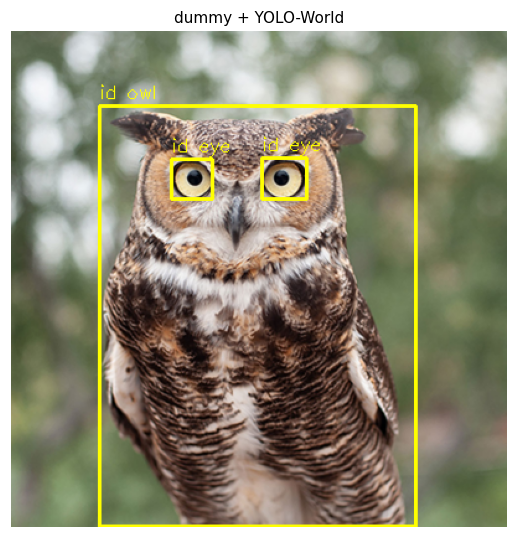

In [4]:
show_grid([(draw_boxes(DUMMY, BOXES, ids=BOX_NAMES), "dummy + YOLO-World")], cols=1, figsize=(5, 5))


## 2. Data augmentation

Ultralytics samples each param in a range. Below: **fixed demo** at the high end of that range so the effect is visible. Title shows the `model.train` name and this-repo value.

HSV: Ultra LUT, `r ~ U(-gain, +gain)`. Demo uses `r = +gain`.
Geometry: Ultra `RandomPerspective` = `T @ S @ R @ P @ C` then `cv2.warpAffine` / `warpPerspective`. Demo uses a fixed angle / shift / scale, not a random draw.


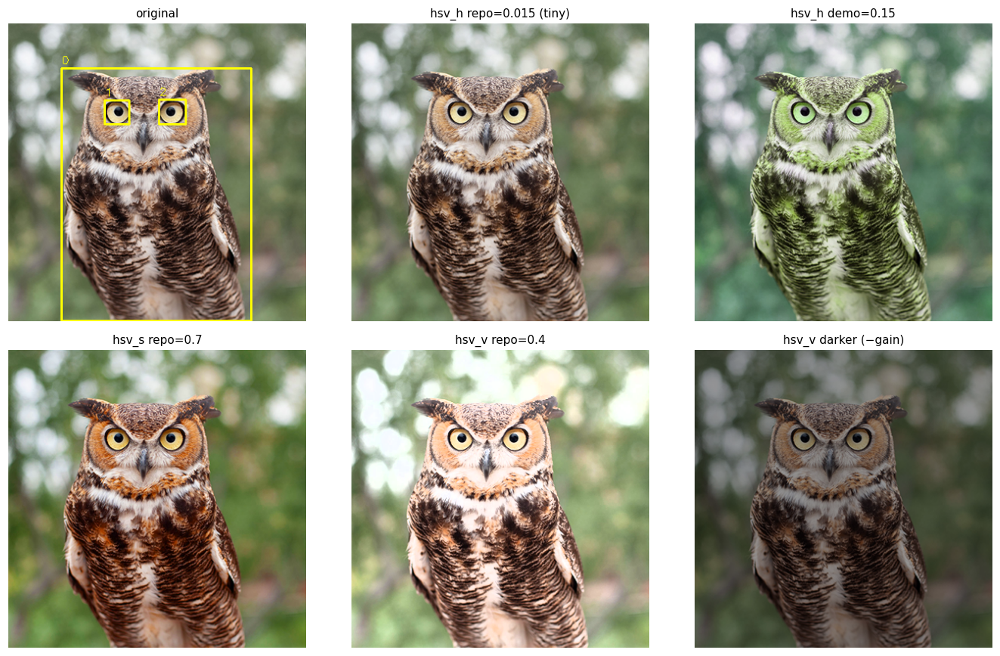

In [6]:
def hsv_gain(img, h=0.0, s=0.0, v=0.0, sign=1.0):
    labels = {"img": img.copy()}

    def _apply(labels, params=None):
        im = labels["img"]
        r = np.array([h, s, v], dtype=np.float32) * sign
        x = np.arange(0, 256, dtype=np.float32)
        lut_hue = ((x + r[0] * 180) % 180).astype(np.uint8)
        lut_sat = np.clip(x * (r[1] + 1), 0, 255).astype(np.uint8)
        lut_val = np.clip(x * (r[2] + 1), 0, 255).astype(np.uint8)
        lut_sat[0] = 0
        hue, sat, val = cv2.split(cv2.cvtColor(im, cv2.COLOR_BGR2HSV))
        hsv = cv2.merge((cv2.LUT(hue, lut_hue), cv2.LUT(sat, lut_sat), cv2.LUT(val, lut_val)))
        labels["img"] = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
        return labels

    return _apply(labels)["img"]


pairs = [
    (draw_boxes(DUMMY, BOXES), "original"),
    (hsv_gain(DUMMY, h=REPO_AUG["hsv_h"]), f"hsv_h repo={REPO_AUG['hsv_h']} (tiny)"),
    (hsv_gain(DUMMY, h=0.15), "hsv_h demo=0.15"),
    (hsv_gain(DUMMY, s=REPO_AUG["hsv_s"]), f"hsv_s repo={REPO_AUG['hsv_s']}"),
    (hsv_gain(DUMMY, v=REPO_AUG["hsv_v"]), f"hsv_v repo={REPO_AUG['hsv_v']}"),
    (hsv_gain(DUMMY, v=REPO_AUG["hsv_v"], sign=-1), "hsv_v darker (−gain)"),
]
show_grid(pairs, cols=3)


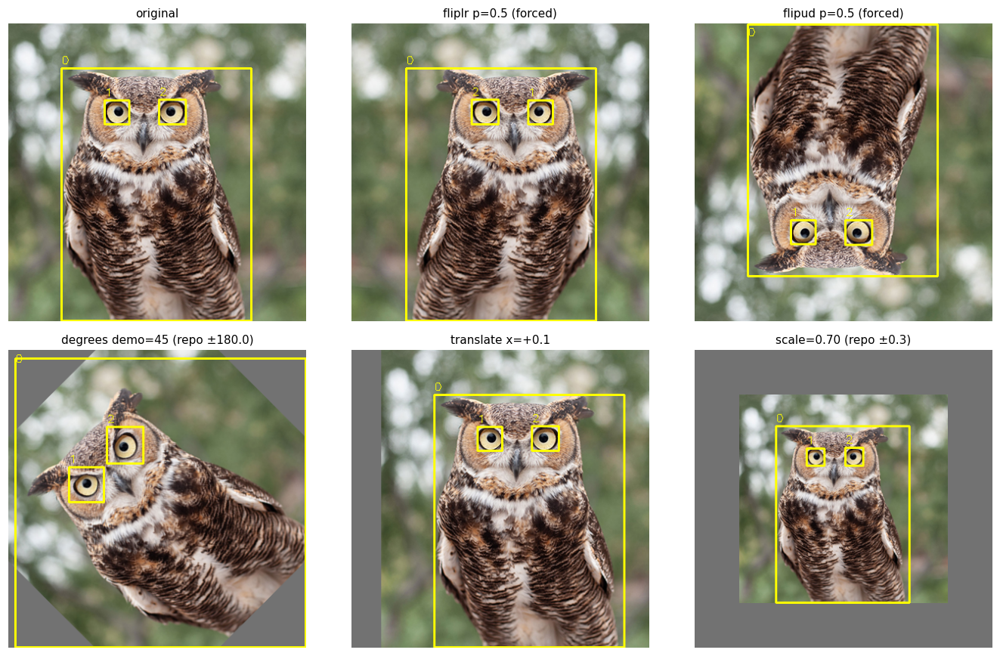

In [7]:
def affine(img, xyxy, *, degrees=0.0, translate=(0.0, 0.0), scale=1.0, shear_deg=0.0, perspective=0.0):
    h, w = img.shape[:2]
    C = np.eye(3, dtype=np.float32)
    C[0, 2] = -w / 2
    C[1, 2] = -h / 2
    P = np.eye(3, dtype=np.float32)
    P[2, 0] = perspective
    P[2, 1] = perspective
    R = np.eye(3, dtype=np.float32)
    R[:2] = cv2.getRotationMatrix2D(angle=degrees, center=(0, 0), scale=scale)
    S = np.eye(3, dtype=np.float32)
    S[0, 1] = math.tan(math.radians(shear_deg))
    S[1, 0] = math.tan(math.radians(shear_deg * 0.4))
    T = np.eye(3, dtype=np.float32)
    T[0, 2] = (0.5 + translate[0]) * w
    T[1, 2] = (0.5 + translate[1]) * h
    M = T @ S @ R @ P @ C
    if abs(perspective) > 0:
        warped = cv2.warpPerspective(img, M, (w, h), borderValue=(114, 114, 114))
    else:
        warped = cv2.warpAffine(img, M[:2], (w, h), borderValue=(114, 114, 114))
    pts = np.concatenate([xyxy[:, [0, 1]], xyxy[:, [2, 1]], xyxy[:, [2, 3]], xyxy[:, [0, 3]]], axis=1).reshape(-1, 2)
    ones = np.ones((len(pts), 1), np.float32)
    q = (M @ np.hstack([pts, ones]).T).T
    q = q[:, :2] / np.maximum(q[:, 2:3], 1e-6)
    q = q.reshape(len(xyxy), 4, 2)
    new = np.concatenate([q.min(1), q.max(1)], 1)
    new[:, [0, 2]] = np.clip(new[:, [0, 2]], 0, w - 1)
    new[:, [1, 3]] = np.clip(new[:, [1, 3]], 0, h - 1)
    return warped, new


def flipped(img, xyxy, direction):
    h, w = img.shape[:2]
    boxes = xyxy.copy()
    if direction == "horizontal":
        im = cv2.flip(img, 1)
        boxes[:, [0, 2]] = w - xyxy[:, [2, 0]]
    else:
        im = cv2.flip(img, 0)
        boxes[:, [1, 3]] = h - xyxy[:, [3, 1]]
    return im, boxes


geo = []
geo.append((draw_boxes(DUMMY, BOXES), "original"))
im, bx = flipped(DUMMY, BOXES, "horizontal")
geo.append((draw_boxes(im, bx), f"fliplr p={REPO_AUG['fliplr']} (forced)"))
im, bx = flipped(DUMMY, BOXES, "vertical")
geo.append((draw_boxes(im, bx), f"flipud p={REPO_AUG['flipud']} (forced)"))
im, bx = affine(DUMMY, BOXES, degrees=45)
geo.append((draw_boxes(im, bx), f"degrees demo=45 (repo ±{REPO_AUG['degrees']})"))
im, bx = affine(DUMMY, BOXES, translate=(REPO_AUG["translate"], 0.0))
geo.append((draw_boxes(im, bx), f"translate x=+{REPO_AUG['translate']}"))
im, bx = affine(DUMMY, BOXES, scale=1.0 - REPO_AUG["scale"])
geo.append((draw_boxes(im, bx), f"scale={1 - REPO_AUG['scale']:.2f} (repo ±{REPO_AUG['scale']})"))
show_grid(geo, cols=3)


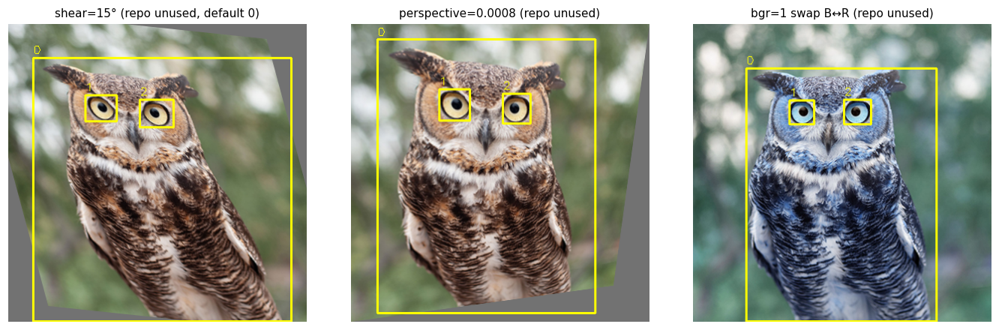

In [8]:
extra = []
im, bx = affine(DUMMY, BOXES, shear_deg=15)
extra.append((draw_boxes(im, bx), "shear=15° (repo unused, default 0)"))
im, bx = affine(DUMMY, BOXES, perspective=0.0008)
extra.append((draw_boxes(im, bx), "perspective=0.0008 (repo unused)"))
bgr = DUMMY[:, :, ::-1].copy()
extra.append((draw_boxes(bgr, BOXES), "bgr=1 swap B↔R (repo unused)"))
show_grid(extra, cols=3)


Mosaic / mixup / cutmix / copy_paste need extra images. Here that is the **same owl at 0° / 90° / 180° / 270°**. Mosaic is **off** in the main train (`mosaic=0`).


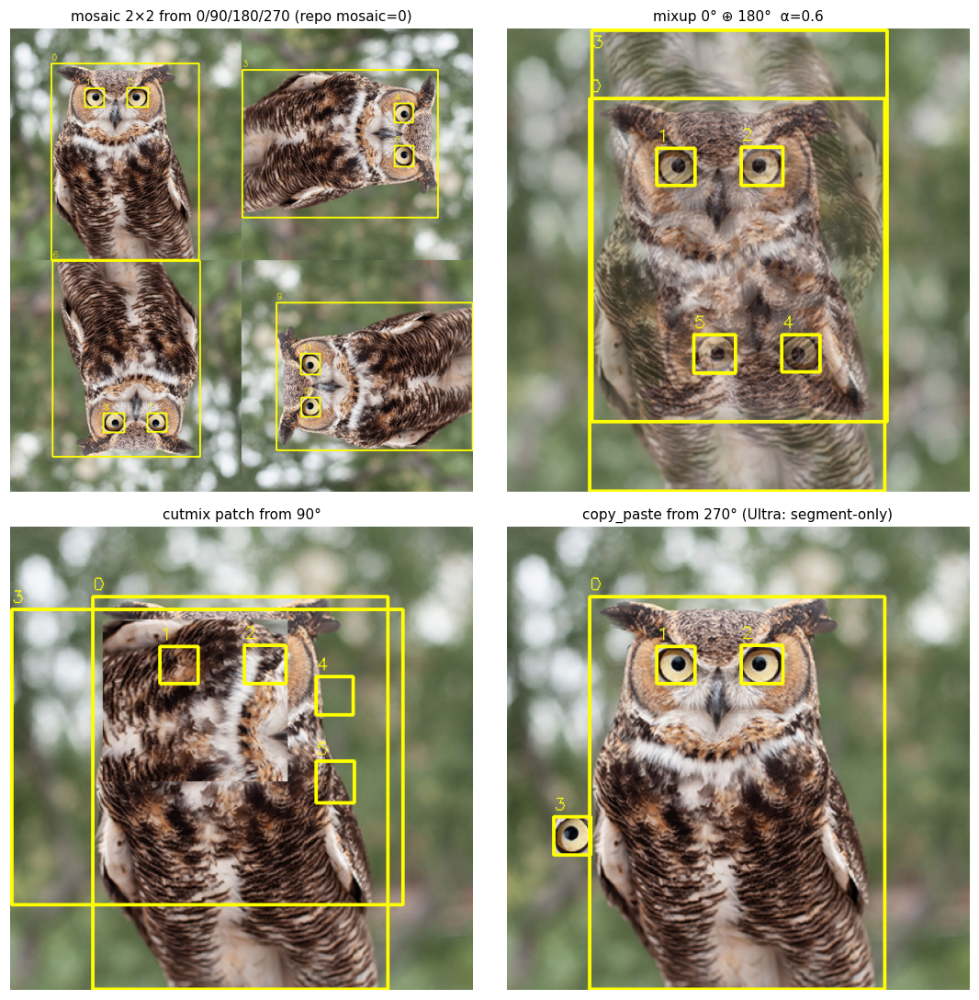

In [9]:
def rot_k(img, xyxy, k):
    """k × 90° clockwise. Square image → no letterbox pad."""
    out, boxes = img.copy(), xyxy.copy()
    for _ in range(k % 4):
        h, w = out.shape[:2]
        out = cv2.rotate(out, cv2.ROTATE_90_CLOCKWISE)
        x1, y1, x2, y2 = boxes.T
        boxes = np.stack([h - y2, x1, h - y1, x2], axis=1).astype(np.float32)
    return out, boxes


tiles = [rot_k(DUMMY, BOXES, k) for k in range(4)]
canvas = np.full((H * 2, W * 2, 3), 114, np.uint8)
mos_boxes = []
for i, (im, bx) in enumerate(tiles):
    r, c = divmod(i, 2)
    y0, x0 = r * H, c * W
    canvas[y0 : y0 + H, x0 : x0 + W] = im
    mos_boxes.append(bx + np.array([x0, y0, x0, y0], np.float32))
mosaic = draw_boxes(canvas, np.vstack(mos_boxes))

im180, bx180 = tiles[2]
mix = cv2.addWeighted(DUMMY, 0.6, im180, 0.4, 0)
mix = draw_boxes(mix, np.vstack([BOXES, bx180]))

im90, bx90 = tiles[1]
cut = DUMMY.copy()
cut[80:220, 80:240] = im90[80:220, 80:240]
cut = draw_boxes(cut, np.vstack([BOXES, bx90]))

paste = DUMMY.copy()
im270, bx270 = tiles[3]
areas = (bx270[:, 2] - bx270[:, 0]) * (bx270[:, 3] - bx270[:, 1])
x1, y1, x2, y2 = bx270[int(np.argmin(areas))].astype(int)
x2, y2 = min(x2, x1 + 80), min(y2, y1 + 80)
roi = im270[y1:y2, x1:x2].copy()
py, px = 250, 40
ph, pw = roi.shape[:2]
paste[py : py + ph, px : px + pw] = roi
paste = draw_boxes(paste, np.vstack([BOXES, [px, py, px + pw, py + ph]]))

show_grid(
    [
        (mosaic, "mosaic 2×2 from 0/90/180/270 (repo mosaic=0)"),
        (mix, "mixup 0° ⊕ 180°  α=0.6"),
        (cut, "cutmix patch from 90°"),
        (paste, "copy_paste from 270° (Ultra: segment-only)"),
    ],
    cols=2,
    figsize=(10, 10),
)


## 3. YOLO parameters

Visual where it changes pixels / schedule. Text for bookkeeping flags.


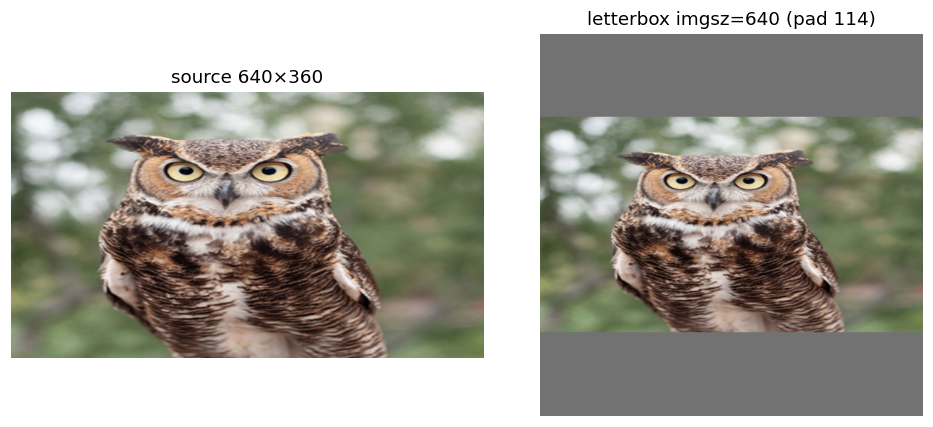

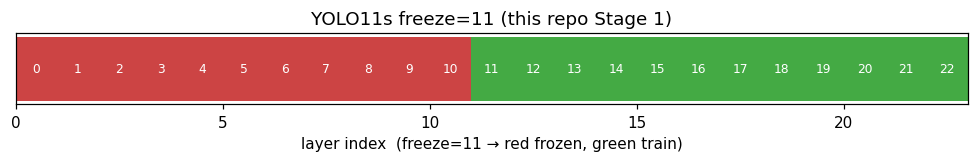

In [12]:
# letterbox imgsz — pad to square, gray 114, keep aspect
wide = cv2.resize(DUMMY, (640, 360))
letter = LetterBox(new_shape=(640, 640), stride=32)(image=wide)

fig, ax = plt.subplots(1, 2, figsize=(9, 4))
ax[0].imshow(bgr_to_rgb(wide)); ax[0].set_title("source 640×360"); ax[0].axis("off")
ax[1].imshow(bgr_to_rgb(letter)); ax[1].set_title("letterbox imgsz=640 (pad 114)"); ax[1].axis("off")
fig.tight_layout(); plt.show()

# freeze: YOLO11s backbone 0–10
fig, ax = plt.subplots(figsize=(9, 1.6))
for i in range(23):
    ax.barh(0, 1, left=i, color="#c44" if i < 11 else "#4a4", height=0.6)
    ax.text(i + 0.5, 0, str(i), ha="center", va="center", color="white", fontsize=8)
ax.set_xlim(0, 23); ax.set_yticks([]); ax.set_xlabel("layer index  (freeze=11 → red frozen, green train)")
ax.set_title("YOLO11s freeze=11 (this repo Stage 1)")
fig.tight_layout(); plt.show()


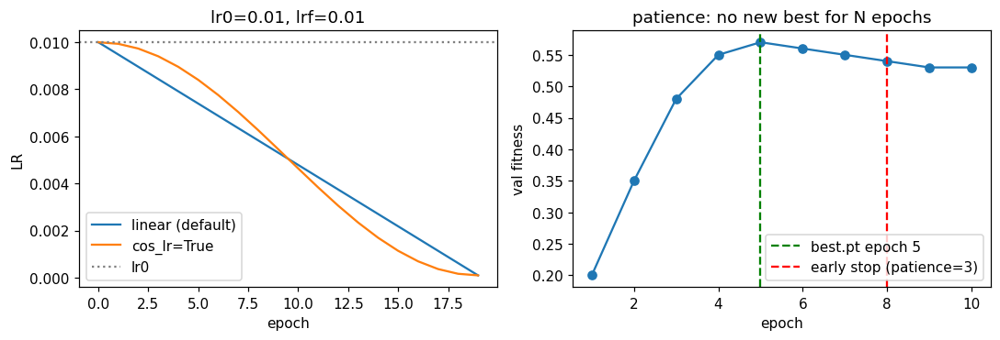

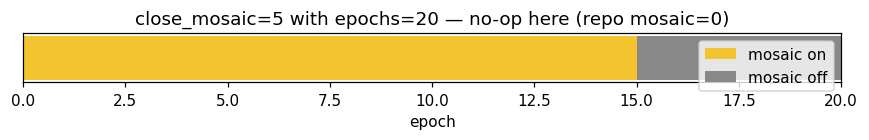

In [13]:
# lr0 / lrf  and  patience
epochs = np.arange(0, 20)
lr0, lrf = 0.01, 0.01
linear = lr0 * (1 - epochs / epochs[-1] * (1 - lrf))
cosine = lrf * lr0 + 0.5 * (lr0 - lrf * lr0) * (1 + np.cos(np.pi * epochs / epochs[-1]))
fig, ax = plt.subplots(1, 2, figsize=(10, 3.5))
ax[0].plot(epochs, linear, label="linear (default)")
ax[0].plot(epochs, cosine, label="cos_lr=True")
ax[0].axhline(lr0, ls=":", color="gray", label="lr0")
ax[0].set_xlabel("epoch"); ax[0].set_ylabel("LR"); ax[0].legend(); ax[0].set_title("lr0=0.01, lrf=0.01")

fitness = np.array([0.20, 0.35, 0.48, 0.55, 0.57, 0.56, 0.55, 0.54, 0.53, 0.53])
best_ep = int(np.argmax(fitness))
patience = 3
stop_at = best_ep + patience
ax[1].plot(np.arange(1, len(fitness) + 1), fitness, marker="o")
ax[1].axvline(best_ep + 1, color="green", ls="--", label=f"best.pt epoch {best_ep+1}")
ax[1].axvline(stop_at + 1, color="red", ls="--", label=f"early stop (patience={patience})")
ax[1].set_xlabel("epoch"); ax[1].set_ylabel("val fitness"); ax[1].legend(); ax[1].set_title("patience: no new best for N epochs")
fig.tight_layout(); plt.show()

# close_mosaic timeline (only if mosaic>0)
ep, close = 20, 5
fig, ax = plt.subplots(figsize=(8, 1.4))
ax.broken_barh([(0, ep - close)], (0, 1), facecolors="#f4c430", label="mosaic on")
ax.broken_barh([(ep - close, close)], (0, 1), facecolors="#888", label="mosaic off")
ax.set_xlim(0, ep); ax.set_yticks([]); ax.set_xlabel("epoch")
ax.set_title("close_mosaic=5 with epochs=20 — no-op here (repo mosaic=0)")
ax.legend(loc="upper right")
fig.tight_layout(); plt.show()


| Arg | Visual? | Note |
| --- | --- | --- |
| `data` | path | we write `outputs/dataset/data.yaml` |
| `epochs` | schedule plots | max passes |
| `imgsz` | letterbox above | multiple of 32 |
| `batch` | — | images / optimizer step; OOM → halve |
| `workers` | — | dataloader processes (0 on MPS in Ultra) |
| `device` | — | `mps` / `cpu` / `0` |
| `project`/`name` | folder | `outputs/runs/<name>/weights/best.pt` |
| `exist_ok` | — | True: reuse dir; False: `name2` |
| `pretrained` | — | `.pt` keeps COCO weights |
| `freeze` | bar above | Stage 1 = 11 |
| `lr0`/`lrf`/`cos_lr` | LR plot | Stage 2 uses `lr0/10` |
| `val` | — | mAP on yaml `val:` (train-video holdout) |
| `patience` | plot above | needs `val=True`; `best.pt` ≠ last |
| `amp` | — | FP16 autocast inside loop |
| `cache` | — | `disk` → `foo.npy` next to `foo.jpg` |
| `plots` | — | False here |
| `save_period` | — | `-1` = only `last.pt`/`best.pt` |
| `resume` | — | False on Stage 2 (new freeze/LR) |
| `close_mosaic` | bar above | no-op while `mosaic=0` |

**predict():** `conf=0.25` drop, `iou=0.7` NMS, `imgsz` letterbox, `max_det=300`. Output `boxes.xyxy / .conf / .cls`.


## 4. SAHI

Probe/autolabel sets `target_tiles`, then `compute_slice_size` (`isqrt(W*H // n)`) and `overlap_for_tiles`. Dummy is 400px so `MIN_SLICE_PX=512` is off (else one tile). Boxes clip to the tile; `min_area_ratio` drops a box if too little remains. `starting_pixel` maps tile xyxy back to the full frame.


tiles with min_area_ratio=0.5 keep 14 clipped boxes (edge box often gone)


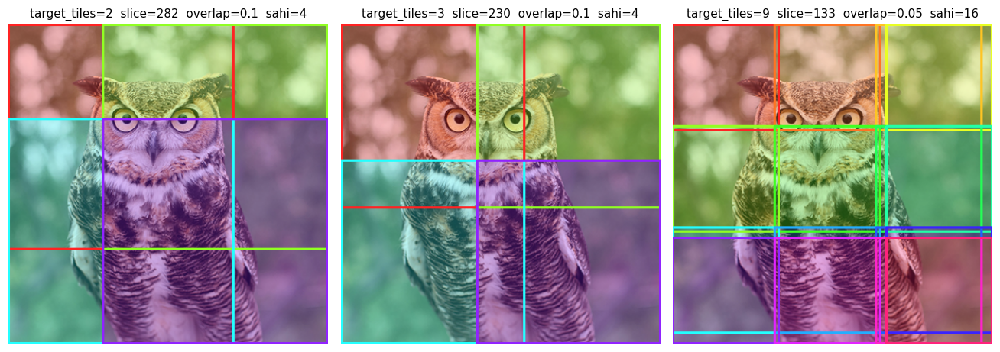

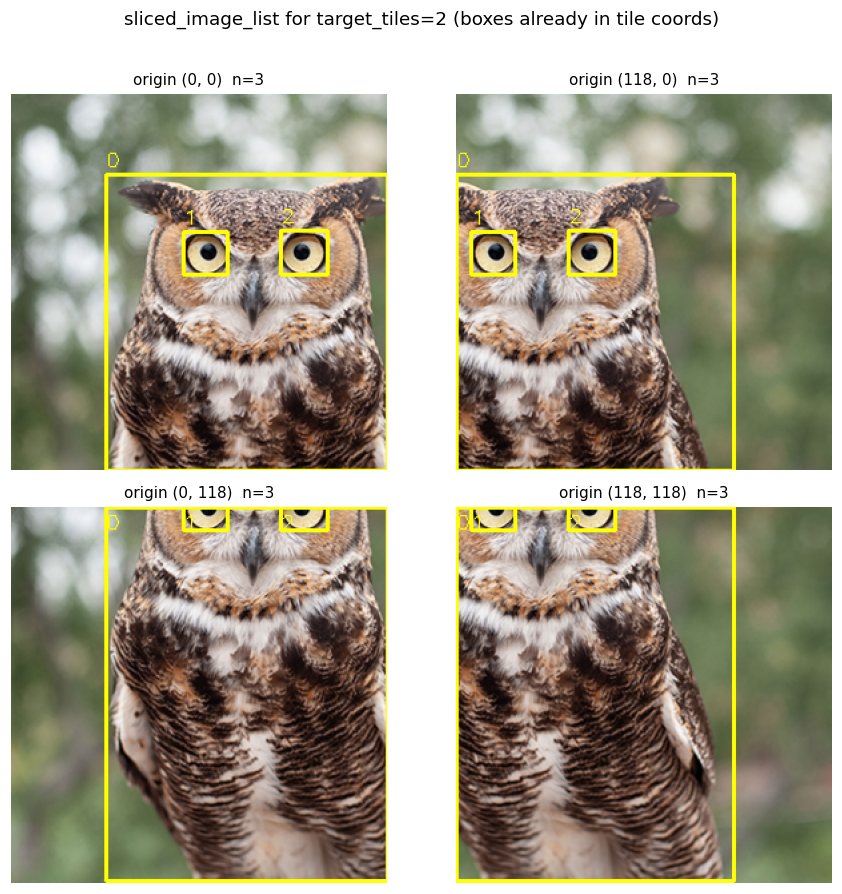

In [15]:
from common.config import overlap_for_tiles

coco = [
    CocoAnnotation.from_coco_bbox(
        bbox=[int(x1), int(y1), int(x2 - x1), int(y2 - y1)],
        category_id=0,
        category_name="vehicle",
    )
    for x1, y1, x2, y2 in BOXES
]


def slice_size_for(target_tiles):
    # same as compute_slice_size without MIN_SLICE_PX=512
    return int(math.isqrt(W * H // target_tiles))


def run_slice(target_tiles, min_area_ratio=0.1):
    ss = slice_size_for(target_tiles)
    ov = overlap_for_tiles(target_tiles)
    result = slice_image(
        DUMMY,
        coco_annotation_list=coco,
        slice_height=ss,
        slice_width=ss,
        overlap_height_ratio=ov,
        overlap_width_ratio=ov,
        auto_slice_resolution=False,
        min_area_ratio=min_area_ratio,
        verbose=False,
    )
    return ss, ov, result


def tile_color(i, n):
    hue = int(180 * i / max(n, 1))
    bgr = cv2.cvtColor(np.uint8([[[hue, 220, 255]]]), cv2.COLOR_HSV2BGR)[0, 0]
    return tuple(int(c) for c in bgr)


def overview_for(result):
    overview = DUMMY.copy()
    n = len(result.sliced_image_list)
    fill = overview.copy()
    rects = []
    for i, sliced in enumerate(result.sliced_image_list):
        x0, y0 = sliced.starting_pixel
        h, w = sliced.image.shape[:2]
        pt1, pt2 = (int(x0), int(y0)), (int(x0) + w - 1, int(y0) + h - 1)
        color = tile_color(i, n)
        rects.append((pt1, pt2, color))
        cv2.rectangle(fill, pt1, pt2, color, -1)
    overview = cv2.addWeighted(fill, 0.28, overview, 0.72, 0)
    for pt1, pt2, color in rects:
        cv2.rectangle(overview, pt1, pt2, color, 2)
    return overview


def tile_pairs(result):
    tiles = []
    for sliced in result.sliced_image_list:
        im = sliced.image.copy()
        if im.ndim == 2:
            im = cv2.cvtColor(im, cv2.COLOR_GRAY2BGR)
        xyxy = []
        for ann in sliced.coco_image.annotations:
            x, y, bw, bh = ann.bbox
            xyxy.append([x, y, x + bw, y + bh])
        cap = f"origin {tuple(sliced.starting_pixel)}  n={len(xyxy)}"
        tiles.append((draw_boxes(im, xyxy) if xyxy else im, cap))
    return tiles


overviews = []
sliced_by_n = {}
for n in (2, 3, 9):
    ss, ov, result = run_slice(n)
    sliced_by_n[n] = (ss, ov, result)
    overviews.append(
        (
            overview_for(result),
            f"target_tiles={n}  slice={ss}  overlap={ov}  sahi={len(result.sliced_image_list)}",
        )
    )
show_grid(overviews, cols=3, figsize=(12, 4.2))

_ss, _ov, result2 = sliced_by_n[2]
show_grid(
    tile_pairs(result2),
    cols=2,
    title="sliced_image_list for target_tiles=2 (boxes already in tile coords)",
)

# min_area_ratio: a box barely in the tile is dropped
edge = CocoAnnotation.from_coco_bbox(bbox=[210, 10, 80, 40], category_id=0, category_name="vehicle")
ss, ov, _ = sliced_by_n[2]
keep = []
for sliced in slice_image(
    DUMMY, coco_annotation_list=coco + [edge], slice_height=ss, slice_width=ss,
    overlap_height_ratio=0, overlap_width_ratio=0, auto_slice_resolution=False,
    min_area_ratio=0.5, verbose=False,
).sliced_image_list:
    for ann in sliced.coco_image.annotations:
        keep.append((sliced.starting_pixel, ann.bbox))
print("tiles with min_area_ratio=0.5 keep", len(keep), "clipped boxes (edge box often gone)")


## 5. Vector transforms as matrices

YOLO affine is a **3×3 homogeneous** matrix `M`. A point `(x, y)` becomes `(x', y')` via `M @ [x, y, 1]`.

OpenCV uses the **same matrix**:
- affine (no perspective) → `cv2.warpAffine(img, M[:2], dsize)` — `getRotationMatrix2D` already returns that 2×3
- perspective (`M[2,0]` or `M[2,1]` ≠ 0) → `cv2.warpPerspective(img, M, dsize)`

Boxes: transform the 4 corners with `M`, then take min/max (do **not** warp the image in numpy just to move boxes).


M (T @ R)
 [[      0.866         0.5     -53.205]
 [       -0.5       0.866      116.79]
 [          0           0           1]]
OpenCV 2×3 for warpAffine = M[:2]
 [[      0.866         0.5     -53.205]
 [       -0.5       0.866      116.79]]
1280² warpAffine: 7.4 ms
1280² numpy inv(M)@pixels (no interpolate): 3.2 ms — then you still need remap
Use OpenCV for images (C++ interpolate). Use numpy M @ corners for boxes. Same numbers, not the same speed.


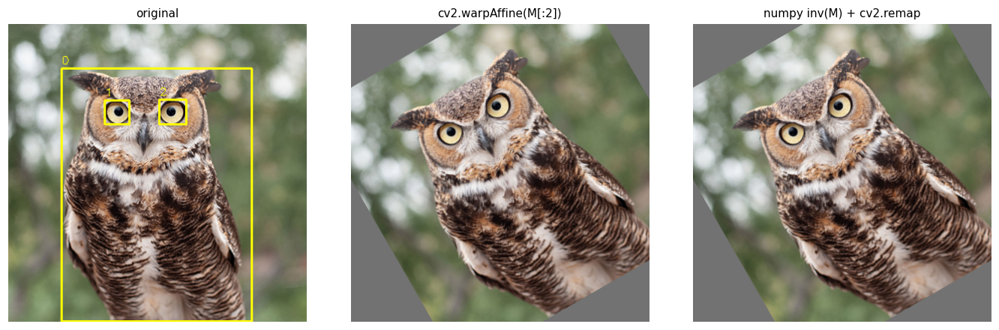

In [18]:
h, w = DUMMY.shape[:2]
cx, cy = w / 2, h / 2
angle, scale, tx, ty = 30.0, 1.0, 20.0, -10.0

R = np.eye(3, dtype=np.float32)
R[:2] = cv2.getRotationMatrix2D((cx, cy), angle, scale)
T = np.eye(3, dtype=np.float32)
T[0, 2], T[1, 2] = tx, ty
M = T @ R
print("M (T @ R)\n", np.round(M, 3))
print("OpenCV 2×3 for warpAffine = M[:2]\n", np.round(M[:2], 3))

im_cv = cv2.warpAffine(DUMMY, M[:2], (w, h), borderValue=(114, 114, 114))

# numpy on pixels (vectorized remap) — same math, slower
yy, xx = np.indices((h, w), dtype=np.float32)
ones = np.ones_like(xx)
src = np.stack([xx, yy, ones], 0).reshape(3, -1)
Minv = np.linalg.inv(M)
map_xy = (Minv @ src)
map_xy /= map_xy[2:3]
map_x = map_xy[0].reshape(h, w).astype(np.float32)
map_y = map_xy[1].reshape(h, w).astype(np.float32)
im_np = cv2.remap(DUMMY, map_x, map_y, cv2.INTER_LINEAR, borderValue=(114, 114, 114))

show_grid(
    [
        (draw_boxes(DUMMY, BOXES), "original"),
        (im_cv, "cv2.warpAffine(M[:2])"),
        (im_np, "numpy inv(M) + cv2.remap"),
    ],
    cols=3,
)

big = cv2.resize(DUMMY, (1280, 1280))
Mb = np.eye(3, dtype=np.float32)
Mb[:2] = cv2.getRotationMatrix2D((640, 640), 30, 1.0)
t0 = time.perf_counter()
for _ in range(8):
    cv2.warpAffine(big, Mb[:2], (1280, 1280), borderValue=(114, 114, 114))
t_cv = (time.perf_counter() - t0) / 8
yy, xx = np.indices((1280, 1280), dtype=np.float32)
src = np.stack([xx, yy, np.ones_like(xx)], 0).reshape(3, -1)
t0 = time.perf_counter()
Minv = np.linalg.inv(Mb)
_ = (Minv @ src)
t_np = time.perf_counter() - t0
print(f"1280² warpAffine: {t_cv*1e3:.1f} ms")
print(f"1280² numpy inv(M)@pixels (no interpolate): {t_np*1e3:.1f} ms — then you still need remap")
print("Use OpenCV for images (C++ interpolate). Use numpy M @ corners for boxes. Same numbers, not the same speed.")


| Transform | 3×3 idea | OpenCV | Same result? | Speed |
| --- | --- | --- | --- | --- |
| translate | `T[0,2]=tx, T[1,2]=ty` | `warpAffine` | yes | OpenCV image, numpy corners |
| rotate+scale | `getRotationMatrix2D` → 2×3 | `warpAffine` | yes | OpenCV |
| shear | `S[0,1]=tan(θx)` | `warpAffine` | yes | OpenCV |
| perspective | `P[2,0], P[2,1]` | **`warpPerspective`** | yes if you pass full 3×3 | OpenCV |
| flip | not a general affine we bother with | `cv2.flip` | yes | OpenCV (or slice) |


## 6. CLAHE

Contrast-Limited Adaptive Histogram Equalization on LAB **L** only (`src/common/image_enhance.py`). Pipeline default is off (`--enhance` on preprocess / autolabel). Strong `clipLimit` invents edges on drone footage.


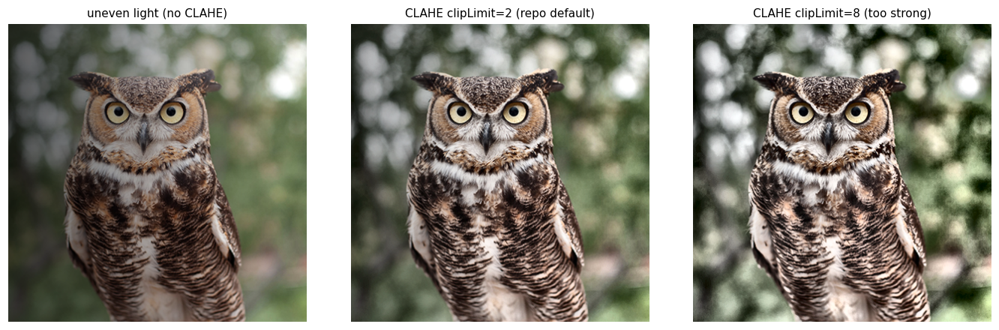

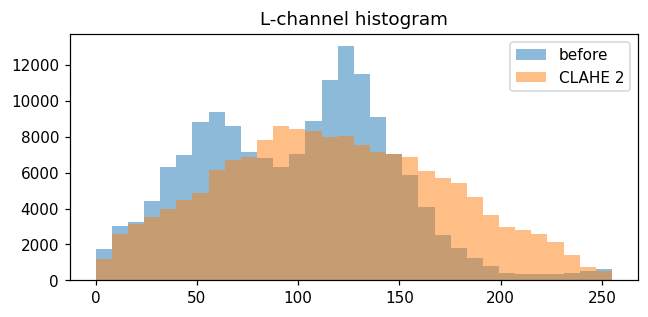

In [21]:
uneven = DUMMY.copy().astype(np.float32)
yy = np.linspace(0.35, 1.15, H)[:, None]
uneven *= yy
uneven = np.clip(uneven, 0, 255).astype(np.uint8)
mild = apply_clahe_bgr(uneven, clip_limit=2.0, tile_grid=(8, 8))
strong = apply_clahe_bgr(uneven, clip_limit=8.0, tile_grid=(8, 8))
show_grid(
    [
        (uneven, "uneven light (no CLAHE)"),
        (mild, "CLAHE clipLimit=2 (repo default)"),
        (strong, "CLAHE clipLimit=8 (too strong)"),
    ],
    cols=3,
)

def L(img):
    return cv2.split(cv2.cvtColor(img, cv2.COLOR_BGR2LAB))[0]

fig, ax = plt.subplots(figsize=(6, 3))
ax.hist(L(uneven).ravel(), bins=32, range=(0, 255), alpha=0.5, label="before")
ax.hist(L(mild).ravel(), bins=32, range=(0, 255), alpha=0.5, label="CLAHE 2")
ax.set_title("L-channel histogram"); ax.legend()
fig.tight_layout(); plt.show()


## 7. ByteTrack / BoT-SORT

Eval clip, center square → 400px. Same `car` boxes into both trackers. Trails = **all timesteps on one image** (colour = time).

**How a track stays alive.** The tracker does not use “moved N pixels”. It asks: do the old box and the new box still overlap enough? Rule of thumb with Ultralytics defaults: **IoU × confidence > 0.2**.

On the first car here (~35×73 px, conf 0.73) that is about **20 px sideways**. Shift less → same ID. Shift more, and Kalman has not seen that speed yet → ID dies. Taller than wide, so up/down can move a bit more than left/right.

**This clip never hits that wall.** Even every 20th frame the cars only move ~4 px. Every frame, every 3rd, every 20th — ByteTrack keeps the ID. The second ID disappearing is the detector (2 cars, then 1), not the tracker.

**Why BoT looks empty after the first frame.** BoT-SORT also tries to undo camera shake (GMC / optical flow). Consecutive video frames: fine. Our stride-20 jumps: flow invents a ~60 px pan. The Kalman box is thrown away from the car, overlap drops to 0, IDs vanish. Turn GMC off (`gmc_method='none'`) and BoT matches ByteTrack on the same boxes.


eval clip 13722965_2160_3840_30fps.mp4: 12 frames, square 400px, start=307 stride=20
cars / frame: [2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
first car 35×73 conf=0.73  →  match while dx < 20.1 px (IoU×conf > 0.2)
ByteTrack IDs: [[1, 2], [2], [2], [2], [2], [2], [2], [2], [2], [2], [2], [2]]
BoT GMC     : [[1, 2], [], [], [], [], [], [], [], [], [], [], []]
BoT gmc=none: [[1, 2], [2], [2], [2], [2], [2], [2], [2], [2], [2], [2], [2]]


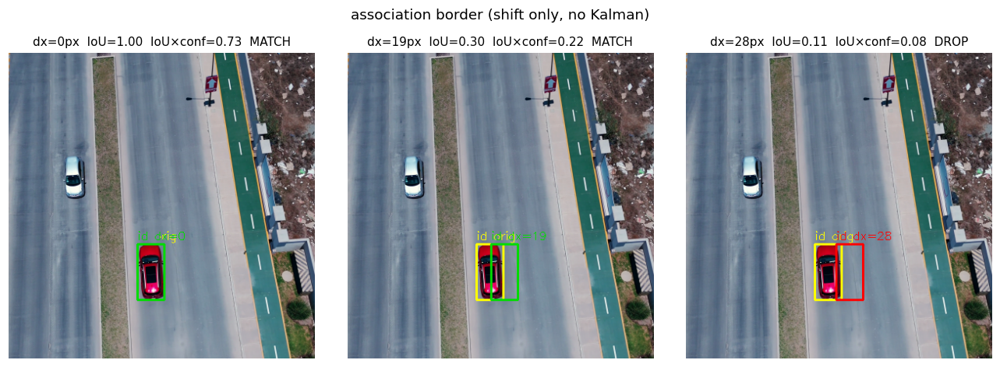

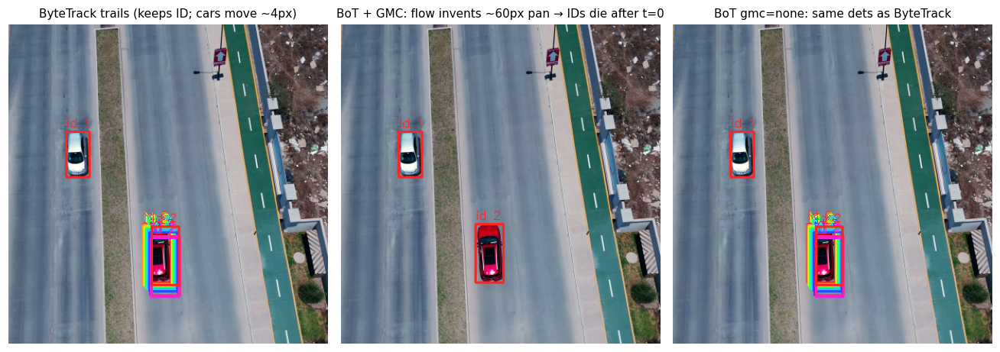

In [22]:
from ultralytics.trackers.byte_tracker import BYTETracker
from ultralytics.trackers.bot_sort import BOTSORT
from ultralytics.trackers.basetrack import BaseTrack


class Dets:
    def __init__(self, xyxy, conf, cls):
        xyxy = np.asarray(xyxy, np.float32)
        if xyxy.ndim == 1:
            xyxy = xyxy.reshape(1, -1)
        if xyxy.size == 0:
            xyxy = np.zeros((0, 4), np.float32)
            conf = np.zeros((0,), np.float32)
            cls = np.zeros((0,), np.float32)
        self.xyxy = xyxy
        self.conf = np.atleast_1d(np.asarray(conf, np.float32))
        self.cls = np.atleast_1d(np.asarray(cls, np.float32))
        if len(self.xyxy):
            x1, y1, x2, y2 = self.xyxy.T
            self.xywh = np.stack([(x1 + x2) / 2, (y1 + y2) / 2, x2 - x1, y2 - y1], 1)
        else:
            self.xywh = np.zeros((0, 4), np.float32)

    def __len__(self):
        return len(self.conf)

    def __getitem__(self, idx):
        return Dets(self.xyxy[idx], self.conf[idx], self.cls[idx])


def tracker_args(kind, **over):
    import ultralytics

    path = Path(ultralytics.__file__).parent / "cfg/trackers" / f"{kind}.yaml"
    cfg = yaml.safe_load(path.read_text())
    cfg.setdefault("track_buffer", 30)
    cfg.setdefault("fuse_score", True)
    if kind == "botsort":
        cfg.setdefault("gmc_method", "sparseOptFlow")
        cfg.setdefault("with_reid", False)
        cfg.setdefault("proximity_thresh", 0.5)
        cfg.setdefault("appearance_thresh", 0.8)
        cfg.setdefault("model", "auto")
    cfg.update(over)
    return SimpleNamespace(**cfg)


def square_crop(frame):
    h, w = frame.shape[:2]
    s = min(h, w)
    y0, x0 = (h - s) // 2, (w - s) // 2
    return frame[y0 : y0 + s, x0 : x0 + s]


def load_eval_clip(n=12, stride=20, start=307, out=400):
    path = ROOT / "data" / "eval" / "13722965_2160_3840_30fps.mp4"
    if not path.is_file():
        raise FileNotFoundError(path)
    cap = cv2.VideoCapture(str(path))
    frames = []
    idx = start
    for _ in range(n):
        cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
        ok, fr = cap.read()
        if not ok:
            break
        fr = square_crop(fr)
        frames.append(cv2.resize(fr, (out, out), interpolation=cv2.INTER_AREA))
        idx += stride
    cap.release()
    print(f"eval clip {path.name}: {len(frames)} frames, square {out}px, start={start} stride={stride}")
    return frames


def detect_cars(frame, model, dev):
    model.set_classes(["car"])
    r = model.predict(frame, conf=0.25, imgsz=640, verbose=False, device=dev)[0]
    xyxy, conf, _ = _parse(r)
    return Dets(xyxy, conf, np.zeros(len(conf), np.float32))


def run_tracker(cls, kind, frames, dets, **over):
    BaseTrack.reset_id()
    tr = cls(tracker_args(kind, **over))
    ids_hist, xyxy_hist = [], []
    for frame, det in zip(frames, dets):
        tracked = tr.update(det, img=frame)
        if len(tracked):
            xyxy_hist.append(tracked[:, :4])
            ids_hist.append(tracked[:, 4].astype(int).tolist())
        else:
            xyxy_hist.append(np.zeros((0, 4), np.float32))
            ids_hist.append([])
    return xyxy_hist, ids_hist


def hue(t, n):
    h = int(180 * t / max(n - 1, 1))
    return tuple(int(c) for c in cv2.cvtColor(np.uint8([[[h, 220, 255]]]), cv2.COLOR_HSV2BGR)[0, 0])


def trails(bg, xyxy_hist, ids_hist):
    canvas = bg.copy()
    n = len(xyxy_hist)
    for t, (xyxy, ids) in enumerate(zip(xyxy_hist, ids_hist)):
        canvas = draw_boxes(canvas, xyxy, color=hue(t, n), ids=ids if ids else None)
    return canvas


MATCH_THRESH = 0.8  # yaml; match if 1 - IoU*conf < this


def max_dx(w, conf, match_thresh=MATCH_THRESH):
    t = (1.0 - match_thresh) / conf
    return float(w * (1 - t) / (1 + t))


model, dev = _load_world()
clip_frames = load_eval_clip()
clip_dets = [detect_cars(f, model, dev) for f in clip_frames]
print("cars / frame:", [len(d) for d in clip_dets])

# --- pixel border on the first car (pure shift, no Kalman) ---
d0 = clip_dets[0]
i0 = int(np.argmax((d0.xyxy[:, 2] - d0.xyxy[:, 0]) * (d0.xyxy[:, 3] - d0.xyxy[:, 1])))
box = d0.xyxy[i0]
conf0 = float(d0.conf[i0])
w0, h0 = float(box[2] - box[0]), float(box[3] - box[1])
dx_lim = max_dx(w0, conf0)
print(
    f"first car {w0:.0f}×{h0:.0f} conf={conf0:.2f}  →  match while dx < {dx_lim:.1f} px "
    f"(IoU×conf > {1 - MATCH_THRESH:.1f})"
)

shift_panels = []
for dx in (0, int(dx_lim) - 1, int(dx_lim) + 8):
    shifted = box + np.array([dx, 0, dx, 0], np.float32)
    iv = _iou(box, shifted)
    ok = iv * conf0 > (1 - MATCH_THRESH)
    vis = clip_frames[0].copy()
    vis = draw_boxes(vis, [box], color=(0, 255, 255), ids=["orig"])
    vis = draw_boxes(vis, [shifted], color=(0, 0, 255) if not ok else (0, 220, 0), ids=[f"dx={dx}"])
    shift_panels.append((vis, f"dx={dx}px  IoU={iv:.2f}  IoU×conf={iv * conf0:.2f}  {'MATCH' if ok else 'DROP'}"))
show_grid(shift_panels, cols=3, figsize=(12, 4.2), title="association border (shift only, no Kalman)")

bt_xy, bt_ids = run_tracker(BYTETracker, "bytetrack", clip_frames, clip_dets)
bs_xy, bs_ids = run_tracker(BOTSORT, "botsort", clip_frames, clip_dets)
bn_xy, bn_ids = run_tracker(BOTSORT, "botsort", clip_frames, clip_dets, gmc_method="none")
print("ByteTrack IDs:", bt_ids)
print("BoT GMC     :", bs_ids)
print("BoT gmc=none:", bn_ids)

bg = clip_frames[0]
show_grid(
    [
        (trails(bg, bt_xy, bt_ids), "ByteTrack trails (keeps ID; cars move ~4px)"),
        (trails(bg, bs_xy, bs_ids), "BoT + GMC: flow invents ~60px pan → IDs die after t=0"),
        (trails(bg, bn_xy, bn_ids), "BoT gmc=none: same dets as ByteTrack"),
    ],
    cols=3,
    figsize=(12, 4.2),
)


Needs `lap` (`requirements.txt`). Same detections in all three panels — if IDs differ, it is the tracker.
